In [88]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from ttvfast import models, ttvfast

Tstart=1517.921417
Tend=5800

def calc_ttvs_full(p):
    mp1, sqecosw1, sqesinw1, wpn1, P1 = p[3], p[4], p[5], p[6], p[7]
    mp2, sqecosw2, sqesinw2, wpn2, P2 = p[10], p[11], p[12], p[13], p[14]
    e1, e2 = sqecosw1**2 + sqesinw1**2, sqecosw2**2 + sqesinw2**2
    w1, w2 = np.arctan2(sqesinw1, sqecosw1), np.arctan2(sqesinw2, sqecosw2)
    n1, n2 = (wpn1 - w1) % (2 * np.pi), (wpn2 - w2) % (2 * np.pi)

    gravity, stellar_mass = 0.000295994511, 0.73
    planet1 = models.Planet(mp1 / 332946., P1, e1, 90, 180, np.rad2deg(w1), np.rad2deg(n1))
    planet2 = models.Planet(mp2 / 332946., P2, e2, 90, 180, np.rad2deg(w2), np.rad2deg(n2))
    results = ttvfast([planet1, planet2], stellar_mass, Tstart, 0.1, Tend)

    pl, model_epoch, model_tt, model_vsky = map(np.array, [results['positions'][0], results['positions'][1], results['positions'][2], results['positions'][4]])
    pl1_index, pl2_index = np.where((pl == 0) & (model_vsky > 0))[0], np.where((pl == 1) & (model_vsky > 0))[0]
    model_epoch1, model_tt1 = model_epoch[pl1_index], model_tt[pl1_index]
    model_epoch2, model_tt2 = model_epoch[pl2_index], model_tt[pl2_index]

    def linear_regression(X, y):
        regressor = LinearRegression().fit(X.reshape(-1, 1), y)
        residuals = y - regressor.predict(X.reshape(-1, 1))
        return residuals, regressor.coef_

    residuals_tt1, Pb = linear_regression(model_epoch1, model_tt1)
    residuals_tt2, Pc = linear_regression(model_epoch2, model_tt2)
    return model_epoch1, model_epoch2, model_tt1, model_tt2, residuals_tt1, residuals_tt2, Pb, Pc

p=[ 1.46840934e+01,  4.17530770e-01,  3.69333585e-02,10.2,  3.06358386e-02,
  5.47890505e-01 , 1.77032863e+00,  6.39814142e+00 , 4.13191861e-01,
  3.39249786e-02,9.7, -3.27206806e-02,  2.83848810e-01,  2.64006150e+00,
  1.88803002e+01,  5.13541233e-01,  1.66618171e-01, -1.49245579e+01,
 -1.37407142e+01, -1.57576637e+01, -1.39691274e+01,  7.64752840e-01,
  1.27183317e+00,  1.90660999e+00,  1.13216500e+00,  5.28340332e-04,
  8.91321158e-04,  5.10434401e-04,  4.95868483e-04]

#mb=10.2
#e1=0.301
#mc=9.7
#e2=0.0795

data_b = pd.read_csv("../ttv/TTV_TOI-560b.csv", header=None)
epoch_b = data_b.iloc[:,0]
ob_b_1 = list(data_b.iloc[:,1])
ob_err_b_1 = list(data_b.iloc[:,2])

data_c = pd.read_csv("../ttv/TTV_TOI-560c.csv", header=None)
epoch_c = data_c.iloc[:,0]
ob_c_1 = list(data_c.iloc[:,1])
ob_err_c_1 = list(data_c.iloc[:,2])

## check!!
ob_b=calc_ttvs_full(p)[2]
ob_c=calc_ttvs_full(p)[3]
ttv_b=calc_ttvs_full(p)[4]
ttv_c=calc_ttvs_full(p)[5]

#ob_b = calc_ttvs_full(p)[2][::2]
#ob_c = calc_ttvs_full(p)[3][::2]
#ttv_b = calc_ttvs_full(p)[4][::2]
#ttv_c = calc_ttvs_full(p)[5][::2]

## check!!
#std_dev_b = 0.0005
#std_dev_c = 0.0015
#ob_b = np.array([np.random.normal(loc=value, scale=std_dev_b) for value in ob_b])
#ob_c = np.array([np.random.normal(loc=value, scale=std_dev_c) for value in ob_c])

lower_bound = 0
upper_bound = 120

mask_b = (ob_b % 365 >= lower_bound) & (ob_b % 365 <= upper_bound) & (ob_b>3900) & (ob_b<5400)
mask_c = (ob_c % 365 >= lower_bound) & (ob_c % 365 <= upper_bound) & (ob_c>3900) & (ob_c<5400)

# Apply the masks to all corresponding arrays
ob_b = ob_b[mask_b]
ttv_b = ttv_b[mask_b]

ob_c = ob_c[mask_c]
ttv_c = ttv_c[mask_c]


## check!!
#ob_err_b = [0.001855] * len(ob_b)
#ob_err_b = [0.00102] * len(ob_b)
## bestな観測
ob_err_b=[0.00056]*len(ob_b)
#ob_err_c = [0.002652] * len(ob_c)
ob_err_c = [0.001458] * len(ob_c)


ob_b = np.concatenate((ob_b_1, ob_b))
ob_err_b = np.concatenate((ob_err_b_1, ob_err_b))
ob_c = np.concatenate((ob_c_1, ob_c))
ob_err_c = np.concatenate((ob_err_c_1, ob_err_c))

Pb=calc_ttvs_full(p)[6]
Pc=calc_ttvs_full(p)[7]

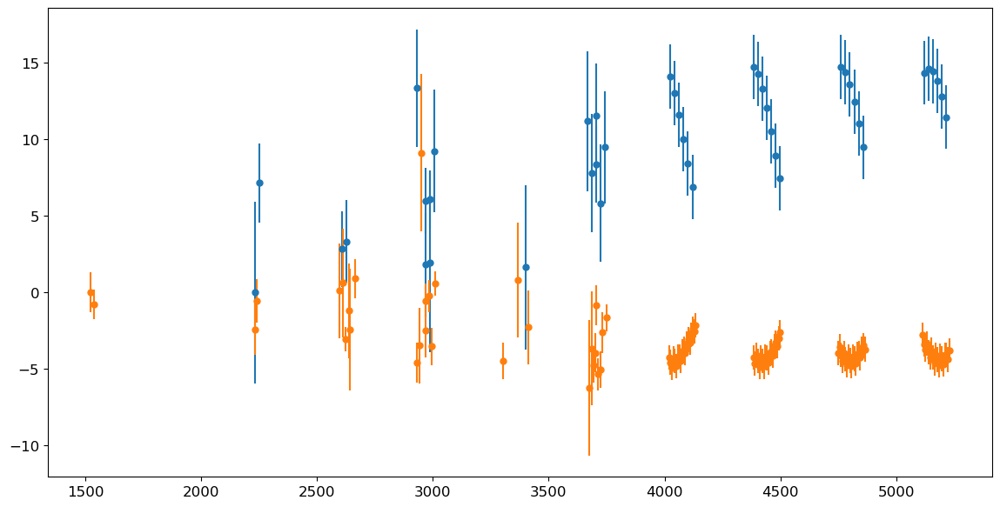

In [89]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from ttvfast import models
import ttvfast
from matplotlib.ticker import AutoMinorLocator
import emcee
import corner
from multiprocessing import Pool
from scipy.optimize import minimize
import os
os.environ['OMP_NUM_THREADS']='1'
os.nice(19)

Tc0b = ob_b[0]
Tc0c = ob_c[0]

#Tstartから最初の観測までは何周期たっているか（その切り捨て）
epc0 = np.floor((Tc0c-Tstart)/Pc)
epb0 = np.floor((Tc0b-Tstart)/Pb)

#Tstartから任意の観測までは何周期たっているか（その切り捨てすなわちepoch）
epc = np.floor((ob_c-Tstart)/Pc)
epb = np.floor((ob_b-Tstart)/Pb)

#ttvの量
ttvc = ob_c - (Tc0c +(epc-epc0)*Pc)
ttvb = ob_b - (Tc0b +(epb-epb0)*Pb)
plt.figure(figsize=(14, 7))
plt.errorbar(ob_c, ttvc*1440, yerr=ob_err_c*1440, fmt='o',ms=5)
plt.errorbar(ob_b, ttvb*1440, yerr=ob_err_b*1440, fmt='o',ms=5)

#pを渡してttvfastから得られる配列を渡す関数を定義
def calc_ttvs_2pl(p):

    mp1 = p[0]
    sqecosw1 = p[1]
    sqesinw1 = p[2]
    wpM1 = p[3] # w + M, radians,0~2*pi
    P1 = p[4]

    mp2 = p[5]
    sqecosw2 = p[6]
    sqesinw2 = p[7]
    wpM2 = p[8] # w + M, radians,0~2*pi
    P2 = p[9]
    
    #軌道要素に戻す
    e1 = sqecosw1**2 + sqesinw1**2
    e2 = sqecosw2**2 + sqesinw2**2
    w1 = np.arctan2(sqesinw1, sqecosw1) #radian,-pi~pi
    w2 = np.arctan2(sqesinw2, sqecosw2) #radian,-pi~pi
    M1 = wpM1 - w1 #radian, 幅広い値を取るが、MCMCで求める量ではないし、ttvfastには影響を与えないからこれでいい
    M2 = wpM2 - w2 #radian,

    if M1<0:
        M1+=2*np.pi
    if M1<0:
        M1+=2*np.pi
    if M2<0:
        M2+=2*np.pi
    if M2<0:
        M2+=2*np.pi
    
    gravity = 0.000295994511                        # AU^3/day^2/M_sun
    stellar_mass = 0.73                    # M_sun

    #多分これでいい
    planet1 = models.Planet(
        mass=mp1 / 332946.,                         # M_sun
        period=P1,              # days
        eccentricity=e1,
        inclination=90,         # degrees
        longnode=180,           # degrees
        argument=np.rad2deg(w1),            # degreesに変換！
        mean_anomaly= np.rad2deg(M1),       # degreesに変換！
    )

    planet2 = models.Planet(
        mass=mp2 / 332946.,
        period=P2,
        eccentricity=e2,
        inclination=90,
        longnode=180,
        argument=np.rad2deg(w2),
        mean_anomaly= np.rad2deg(M2),
    )
    

    planets = [planet1, planet2]
    dt = 0.3

    return ttvfast.ttvfast(planets, stellar_mass, Tstart, dt, Tend)

In [90]:
def log_likelihood(p):
    mp1 = p[0]
    sqecosw1 = p[1]
    sqesinw1 = p[2]
    wpM1 = p[3] # radian
    P1 = p[4]

    mp2 = p[5]
    sqecosw2 = p[6]
    sqesinw2 = p[7]
    wpM2 = p[8] # radian
    P2 = p[9]

    #あり得ない値を排除        
    if sqecosw1 <= -1. or sqecosw1 >= 1.0 or sqesinw1 <= -1. or sqesinw1 >= 1.0:
        return -np.inf
    
    if sqecosw2 <= -1. or sqecosw2 >= 1.0 or sqesinw2 <= -1. or sqesinw2 >= 1.0:
        return -np.inf
    
    e1 = sqecosw1**2 + sqesinw1**2
    e2 = sqecosw2**2 + sqesinw2**2

    if e1 <=1e-10 or e1 >= 0.9:
        return -np.inf

    if e2 <=1e-10 or e2 >= 0.9:
        return -np.inf
        
    if P1 < 0 or P2 < 0:
        return -np.inf
    
    if mp1 < 0:
        return -np.inf

    if mp2 < 0:
        return -np.inf

    if wpM1 < 0 or wpM1 > 2*np.pi: #radianのとりうる範囲は0から2pi
        return -np.inf
    
    if wpM2 < 0 or wpM2 > 2*np.pi:
        return -np.inf    

   
    try:
        results = calc_ttvs_2pl(p)
    except:
        return -np.inf

    #配列データの整理
    pl = np.array(results['positions'][0])
    model_epoch = np.array(results['positions'][1])
    model_tt = np.array(results['positions'][2])
    model_vsky = np.array(results['positions'][4])

    #？？？model_vskyの意味
    pl1_index = np.where((pl==0) & (model_vsky>0))[0]
    pl2_index = np.where((pl==1) & (model_vsky>0))[0]

    model_epoch1 = model_epoch[pl1_index]
    model_epoch2 = model_epoch[pl2_index]
    model_tt1 = model_tt[pl1_index]
    model_tt2 = model_tt[pl2_index]

    #likelihoodの計算
    log_like=0   

    for i in range(len(epb)):
        Tc_model = model_tt1[model_epoch1==(int(epb[i]))]
        if(len(Tc_model)==0):
            return -np.inf
        
        if abs(ob_b[i] - Tc_model[0]) > 1: #[day]
            #print("bでエラー")
            return -np.inf
              
        log_like += (-0.5*(ob_b[i] - Tc_model[0])**2 / (ob_err_b[i]**2))-0.5*np.log(2*np.pi*(ob_err_b[i]**2))



    ## planet2
    for i in range(len(epc)):
        Tc_model = model_tt2[model_epoch2==(int(epc[i]))]
        if(len(Tc_model)==0):
            return -np.inf
        

        if abs(ob_c[i] - Tc_model[0]) > 1:
            #print("cでエラー")
            return -np.inf
                         
        log_like += (-0.5*(ob_c[i] - Tc_model[0])**2 / (ob_err_c[i]**2))-0.5*np.log(2*np.pi*(ob_err_c[i]**2))
    return log_like    

def log_prior(P):
    mp1=P[0]
    mp2=P[5]
    lp=0

    return lp

def log_posterior(p):
    lp = log_prior(p)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(p)

def neg_log_posterior(p):
    return -1* log_posterior(p)

In [98]:
def mcmc_first():
    mp1 = 0.1
    e1 = 0.001
    w1 = np.radians(-76)
    sqecosw1 = np.sqrt(e1)*np.cos(w1)
    sqesinw1 = np.sqrt(e1)*np.sin(w1)
    wpM1 = (Tstart-Tc0b)/Pb*2*np.pi + np.pi/2
    wpM1 =  np.float64((wpM1/(2*np.pi) - np.floor(wpM1/(2*np.pi)))*2*np.pi) #0から2piに
    P1 =  6.398050683568169

    mp2 = 0.1
    e2 = 0.001
    w2 = np.radians(-41.6)
    sqecosw2 = np.sqrt(e2)*np.cos(w2)
    sqesinw2 = np.sqrt(e2)*np.sin(w2)
    wpM2 = (Tstart-Tc0c)/Pc*2*np.pi + np.pi/2
    wpM2 = np.float64((wpM2/(2*np.pi) - np.floor(wpM2/(2*np.pi)))*2*np.pi) #0から2piに
    P2 = 18.87925686582526
    
    p0 = [mp1, sqecosw1, sqesinw1, wpM1, P1, mp2, sqecosw2, sqesinw2, wpM2, P2]

    print(log_posterior(p0))
    print(p0)
    
    res = minimize(neg_log_posterior, p0, method='Nelder-Mead')
    print(log_posterior(res.x))    
    print(res.x)
    mp1, sqecosw1, sqesinw1, wpM1, P1, mp2, sqecosw2, sqesinw2, wpM2, P2=res.x[0:10]
    e1=sqecosw1**2+sqesinw1**2
    e2=sqecosw2**2+sqesinw2**2
    
    #walkerを1000にしてcutする
    
    ndim, nwalkers = len(p0), 1000

    mpmin1, mpmax1= mp1-0.1, mp1+0.1
    mpmin2, mpmax2= mp2-0.1, mp2+0.1

    #各walkerの初期位置をずらす
    pos = []
    for i in range(nwalkers):

        e1_tmp = e1 + 1e-7*np.random.rand(1)
        e2_tmp = e2 + 1e-7*np.random.rand(1)
        w1_tmp = np.pi*(2*np.random.rand(1)-1)
        w2_tmp = np.pi*(2*np.random.rand(1)-1)
        sqecosw1_tmp = np.sqrt(e1_tmp)*np.cos(w1_tmp)
        sqesinw1_tmp = np.sqrt(e1_tmp)*np.sin(w1_tmp)
        sqecosw2_tmp = np.sqrt(e2_tmp)*np.cos(w2_tmp)
        sqesinw2_tmp = np.sqrt(e2_tmp)*np.sin(w2_tmp)

        wpM1_tmp = (Tstart-Tc0b)/Pb*2*np.pi + np.pi/2. + 1e-5*np.random.randn(1)
        wpM1_tmp = (wpM1_tmp/(2*np.pi) - np.floor(wpM1_tmp/(2*np.pi)))*2*np.pi
        wpM2_tmp = (Tstart-Tc0c)/Pc*2*np.pi + np.pi/2. + 1e-5*np.random.randn(1)
        wpM2_tmp = (wpM2_tmp/(2*np.pi) - np.floor(wpM2_tmp/(2*np.pi)))*2*np.pi


        pos_tmp = np.empty(0)

        pos_tmp = np.append(pos_tmp, mpmin1 + (mpmax1-mpmin1)*np.random.rand(1)) # mp1
        pos_tmp = np.append(pos_tmp, np.array((sqecosw1_tmp,sqesinw1_tmp,wpM1_tmp)))  
        pos_tmp = np.append(pos_tmp, P1 + 1e-8*np.random.randn(1)) # P1

        pos_tmp = np.append(pos_tmp, mpmin2 + (mpmax2-mpmin2)*np.random.rand(1)) # mp2
        pos_tmp = np.append(pos_tmp, np.array((sqecosw2_tmp,sqesinw2_tmp,wpM2_tmp)))  
        pos_tmp = np.append(pos_tmp, P2 + 1e-8*np.random.randn(1)) # P2

        pos.append(pos_tmp)

    #stepの数を変更
    nsteps = 100000
    ndim = len(p0)

    #filename = 'mcmc_ttvfit.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,moves=emcee.moves.DEMove(),pool=pool)
        sampler.run_mcmc(pos, nsteps, progress=True)

    # sampler = emcee.EnsembleSampler(nwalkers, ndim, log_like_2pl, moves=emcee.moves.DEMove())
    # sampler.run_mcmc(pos, nsteps, progress=True)

    #ここの値も変更
    discard=50000
    thin=50
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])


    ntop=200
    
    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    index = argsort[-(ntop+1):-1]
    pos = samples[-1,index,:]
    
    
    return pos

In [99]:
def mcmc_second(pos):
    #stepの数を変更
    nwalkers=200
    nsteps = 100000
    ndim=10

    #配列のappendを理解
    #ここを解決

    #filename = 'mcmc_ttvfit_pl3_2.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    #ここ
    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,moves=emcee.moves.DEMove(),pool=pool)
        sampler.run_mcmc(pos, nsteps,progress=True)


    #ここの値も変更
    discard=50000
    thin=100
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])

    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    pos = samples[-1,:,:]
    
    return pos

def mcmc_second_last(pos):
    #stepの数を変更
    nwalkers=200
    nsteps = 100000
    ndim=10

    #配列のappendを理解
    #ここを解決

    #filename = 'mcmc_ttvfit_pl3_2.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    #ここ
    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,moves=emcee.moves.DEMove(),pool=pool)
        sampler.run_mcmc(pos, nsteps,progress=True)


    #ここの値も変更
    discard=50000
    thin=100
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])

    ntop=100
    
    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    index = argsort[-(ntop+1):-1]
    pos = samples[-1,index,:]
    
    return pos

def mcmc_third(pos):
    #stepの数を変更
    nwalkers=100
    nsteps = 100000
    ndim=10

    #配列のappendを理解
    #ここを解決

    #filename = 'mcmc_ttvfit_pl3_2.hd5'
    #backend = emcee.backends.HDFBackend(filename)
    #backend.reset(nwalkers, ndim)

    #ここ
    with Pool(48) as pool:
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior,pool=pool)
        sampler.run_mcmc(pos, nsteps,progress=True)


    #ここの値も変更
    discard=50000
    thin=100
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)

    for i in range(10):
        mcmc = np.percentile(samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        print(mcmc[1], "+",q[1], "-", q[0])

    fig = corner.corner(samples, labels=["mb", "sqecosw1", "sqesinw1", "wpM1", "Pb", "mc", "sqecosw2", "sqesinw2", "wpM2", "Pc"],quantiles=[0.16,0.5,0.84],show_titles=True, title_fmt='.3f', label_kwargs={'fontsize':20})
    #plt.savefig("ttv_corner_try1_best_お試し.png", format="png", dpi=300)
    plt.show()

    log_prob = sampler.get_log_prob()
    print(log_prob)
    plt.figure(figsize=(8,4))
    plt.rcParams['font.size']=12
    for i in range(nwalkers):
        plt.plot(log_prob[:,i],alpha=0.1)
    plt.xlabel('Number of steps', fontsize=20)
    plt.ylabel('Log probability', fontsize=20)
    plt.show()

    log_prob = sampler.get_log_prob(flat=True, discard=discard, thin=thin)
    samples = sampler.get_chain(discard=discard, thin=thin, flat=True)
    argmax = np.argmax(log_prob)
    print(log_prob[argmax])
    print(samples[argmax,:])

    log_prob = sampler.get_log_prob()
    samples = sampler.get_chain()
    argsort = np.argsort(log_prob[-1])
    pos = samples[-1,:,:]
    
    return pos

/tmp/ipykernel_2581277/3501488870.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  wpM1 =  np.float64((wpM1/(2*np.pi) - np.floor(wpM1/(2*np.pi)))*2*np.pi) #0から2piに
/tmp/ipykernel_2581277/3501488870.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  wpM2 = np.float64((wpM2/(2*np.pi) - np.floor(wpM2/(2*np.pi)))*2*np.pi) #0から2piに


375.42443242707793
[0.1, np.float64(0.00765024205960416), np.float64(-0.030683444989594362), np.float64(1.7977863220313905), 6.398050683568169, 0.1, np.float64(0.023647451959000792), np.float64(-0.02099519030270384), np.float64(2.6232845771206468), 18.87925686582526]
823.9541651093177
[ 1.00009694e-01  7.65181751e-03 -3.06909612e-02  1.79807332e+00
  6.39805301e+00  1.04988529e-01  2.36466674e-02 -2.09938790e-02
  2.62140535e+00  1.88792648e+01]


  6%|██▋                                        | 6364/100000 [42:24<9:48:14,  2.65it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

 56%|██████████████████████▌                 | 56443/100000 [6:07:38<4:40:17,  2.59it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|████████████████████████████████████████| 100000/100000 [10:57:23<00:00,  2.54it/s]


17.28892901912365 + 34.45094918227751 - 14.49992717456717
-0.04823669383080594 + 0.05531409555218339 - 0.02157307576946791
-0.06524193743630412 + 0.09598558019429522 - 0.05433976311984477
1.8077004015398446 + 0.00592502593980182 - 0.009929259116522315
6.3976807337734325 + 0.0002224998951181334 - 0.00014604901441295226
41.69155135028071 + 16.7627699018177 - 24.570675487486394
0.09791731892852328 + 0.04845011311317042 - 0.10154696203989447
-0.0030317593169649345 + 0.045518402171408706 - 0.04965635216935194
2.6013420097244437 + 0.02186484323175497 - 0.022239786947293005
18.88270876395165 + 0.006906528478147322 - 0.0028991465048022746


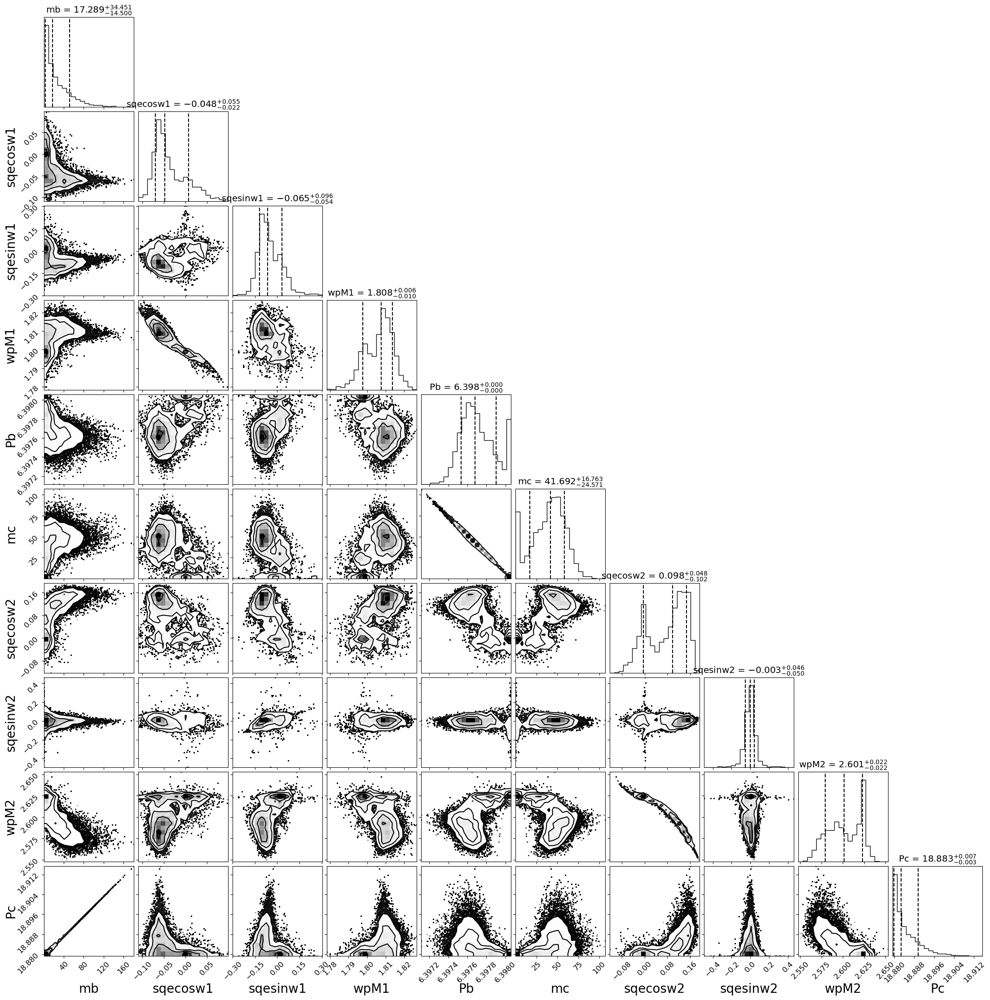

[[696.07347861 728.28370344 631.01967458 ... 796.52378888 511.50011465
  714.56061339]
 [696.07347861 728.28370344 631.01967458 ... 796.52378888 511.50011465
  714.56061339]
 [786.33658249 728.28370344 631.01967458 ... 796.52378888 511.50011465
  714.56061339]
 ...
 [857.98070579 845.24258829 864.43337668 ... 850.14874154 824.66055231
  830.34426898]
 [857.98070579 845.24258829 864.43337668 ... 850.14874154 824.66055231
  830.34426898]
 [857.98070579 845.24258829 864.43337668 ... 850.14874154 824.66055231
  830.34426898]]


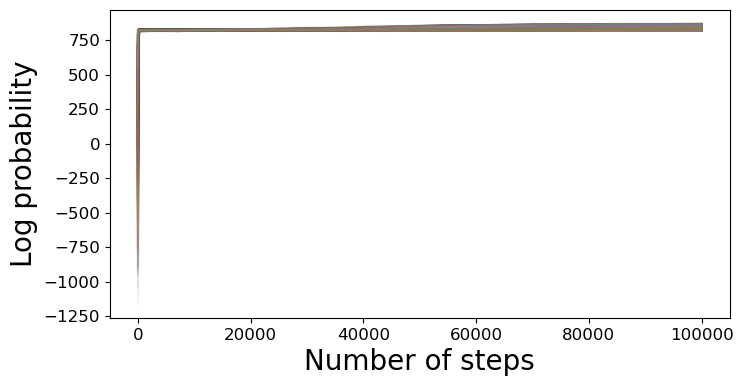

868.3006123936183
[ 7.42470287e+01 -5.93818948e-02 -5.96407633e-02  1.80814679e+00
  6.39766843e+00  4.20193279e+01  1.82099611e-01  3.18441581e-02
  2.55486866e+00  1.88940725e+01]


In [100]:
y=mcmc_first()

100%|█████████████████████████████████████████| 100000/100000 [2:57:11<00:00,  9.41it/s]


59.61006445976993 + 24.46886296523023 - 17.613039162664016
-0.055680210837779354 + 0.022861057228699758 - 0.02274629502623851
-0.007594345765277075 + 0.03116677285466831 - 0.046621312686420883
1.805666064229579 + 0.006502688790354094 - 0.004499169617355969
6.397729861138506 + 6.845869313831798e-05 - 7.700397510834733e-05
33.238032569627656 + 8.320933885250298 - 6.800778353446436
0.2132867497410567 + 0.018701571096057995 - 0.030994829394416445
0.0502523686875706 + 0.025262838959160414 - 0.026105254553421574
2.5285618376686583 + 0.024285514715539414 - 0.01669370823670313
18.89128275180171 + 0.004782064413191733 - 0.0035072448723099114


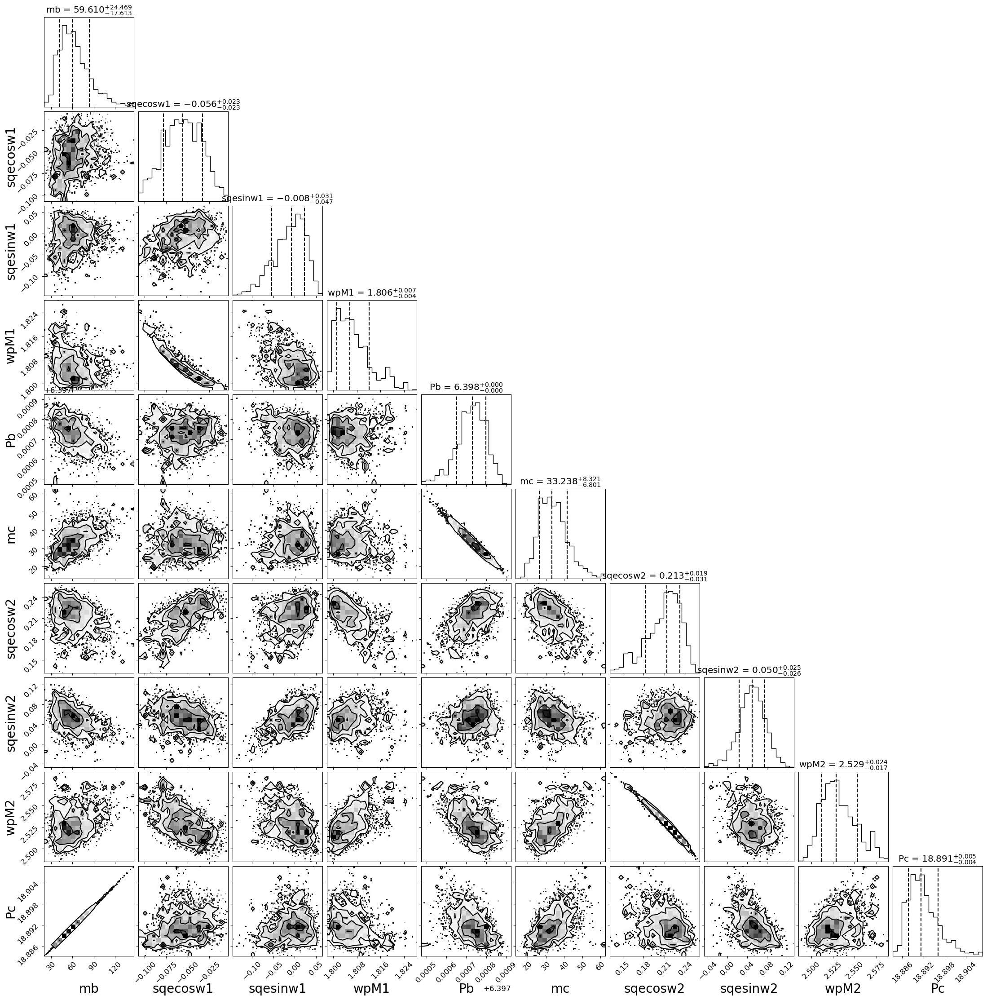

[[861.89736178 861.90335691 861.91916509 ... 867.53376677 867.86712692
  867.97614652]
 [861.89736178 861.90335691 861.91916509 ... 867.53376677 867.86712692
  867.97614652]
 [861.89736178 861.90335691 861.91916509 ... 867.53376677 867.86712692
  867.97614652]
 ...
 [869.47700521 865.85639228 871.39859313 ... 871.82199017 871.79460083
  869.21592582]
 [869.47700521 865.85639228 871.39859313 ... 871.82199017 871.79460083
  869.21592582]
 [869.47700521 865.85639228 871.39859313 ... 871.82199017 871.79460083
  869.21592582]]


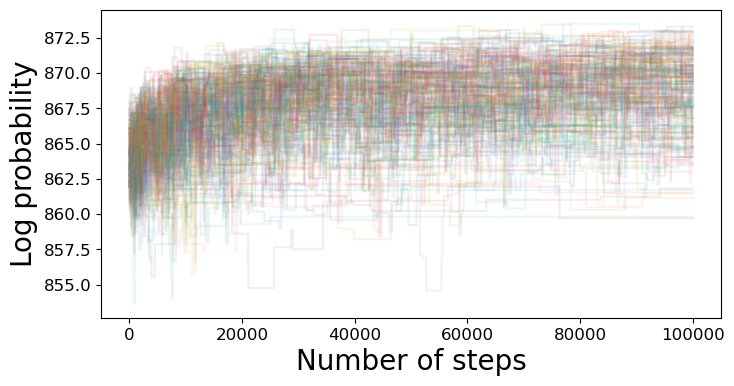

873.5046066038675
[ 6.48731795e+01 -6.03114377e-02  3.66663353e-02  1.80664231e+00
  6.39768979e+00  3.57187121e+01  2.02664875e-01  8.68379142e-02
  2.53356777e+00  1.88924886e+01]


100%|█████████████████████████████████████████| 100000/100000 [3:15:06<00:00,  8.54it/s]


58.37774949953458 + 25.374384770550968 - 19.430568835372746
-0.04393169411076316 + 0.032325795811891586 - 0.03159656256689495
0.014199339557892796 + 0.038885419365623994 - 0.05869091916386948
1.8035328912683632 + 0.008477465571426368 - 0.004486344908476214
6.397730268268227 + 6.890714222596017e-05 - 8.250347950600201e-05
32.61661339295765 + 9.526956200058933 - 6.318177659281599
0.21853419147653597 + 0.021830527369280706 - 0.027798975179240404
0.05812165468823781 + 0.03121578199015708 - 0.03401906583479797
2.5223335419297483 + 0.0245331430040725 - 0.019139779566478055
18.891093084409054 + 0.005023682064837942 - 0.0039041376856729926


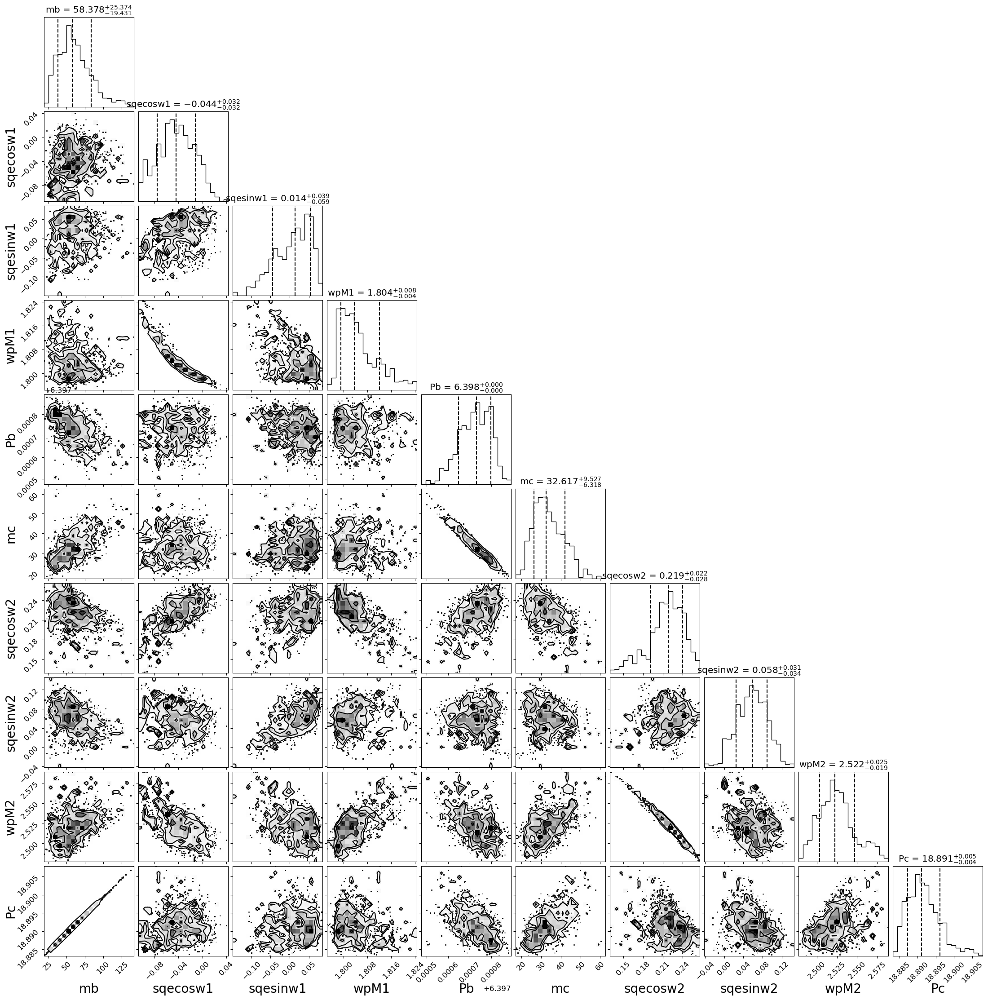

[[869.47700521 865.85639228 871.39859313 ... 871.82199017 871.79460083
  869.21592582]
 [869.47700521 865.85639228 871.39859313 ... 871.82199017 871.79460083
  869.21592582]
 [869.47700521 865.85639228 871.39859313 ... 871.82199017 871.79460083
  869.21592582]
 ...
 [869.95821702 867.29230833 869.958802   ... 872.56041528 869.68632782
  872.13664117]
 [869.95821702 867.29230833 869.958802   ... 872.56041528 869.68632782
  872.13664117]
 [869.95821702 867.29230833 869.958802   ... 872.56041528 869.68632782
  872.13664117]]


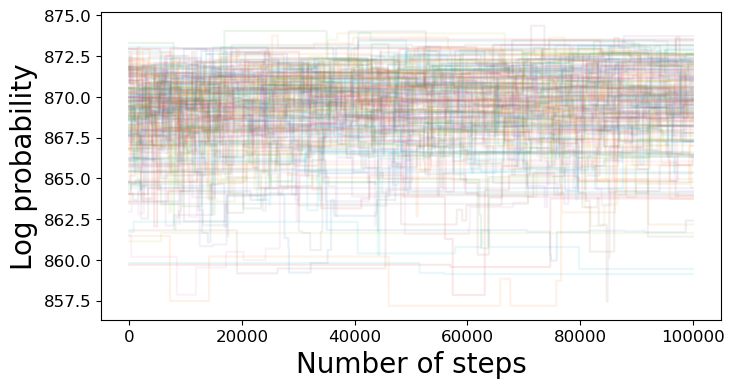

874.3591549582661
[ 6.60915189e+01 -9.04410461e-03  6.02323861e-02  1.79949579e+00
  6.39768403e+00  3.69926230e+01  2.30682247e-01  6.97398373e-02
  2.51173096e+00  1.88926282e+01]


 24%|█████████▉                                | 23584/100000 [50:16<2:40:25,  7.94it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

 74%|███████████████████████████████           | 74053/100000 [6:07:49<46:56,  9.21it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [101]:
for i in range(2):
    y=mcmc_second(y)
y=mcmc_second_last(y)

  6%|██▌                                        | 5998/100000 [07:41<2:11:16, 11.93it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

 20%|████████▍                                 | 19989/100000 [22:09<1:30:18, 14.77it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|█████████████████████████████████████████| 100000/100000 [1:54:24<00:00, 14.57it/s]


60.74343382313013 + 24.991200835840047 - 19.583824094645124
-0.014592028288556137 + 0.041247308182629325 - 0.03852014444574413
0.05967722709798205 + 0.03549795339577473 - 0.05709568765560878
1.7999361795169495 + 0.006067282222971926 - 0.004909201645774575
6.397715055202298 + 8.409446091128814e-05 - 0.00010285303866641726
32.934894042614246 + 9.893496464067255 - 7.557783688549172
0.2325978610055886 + 0.025145404306733843 - 0.029779284784962085
0.0798474335968952 + 0.049560633879271565 - 0.03946663350326736
2.5066467797475283 + 0.024279923763601552 - 0.022129092733177647
18.891602339798155 + 0.0050766989343955515 - 0.003929642124276711


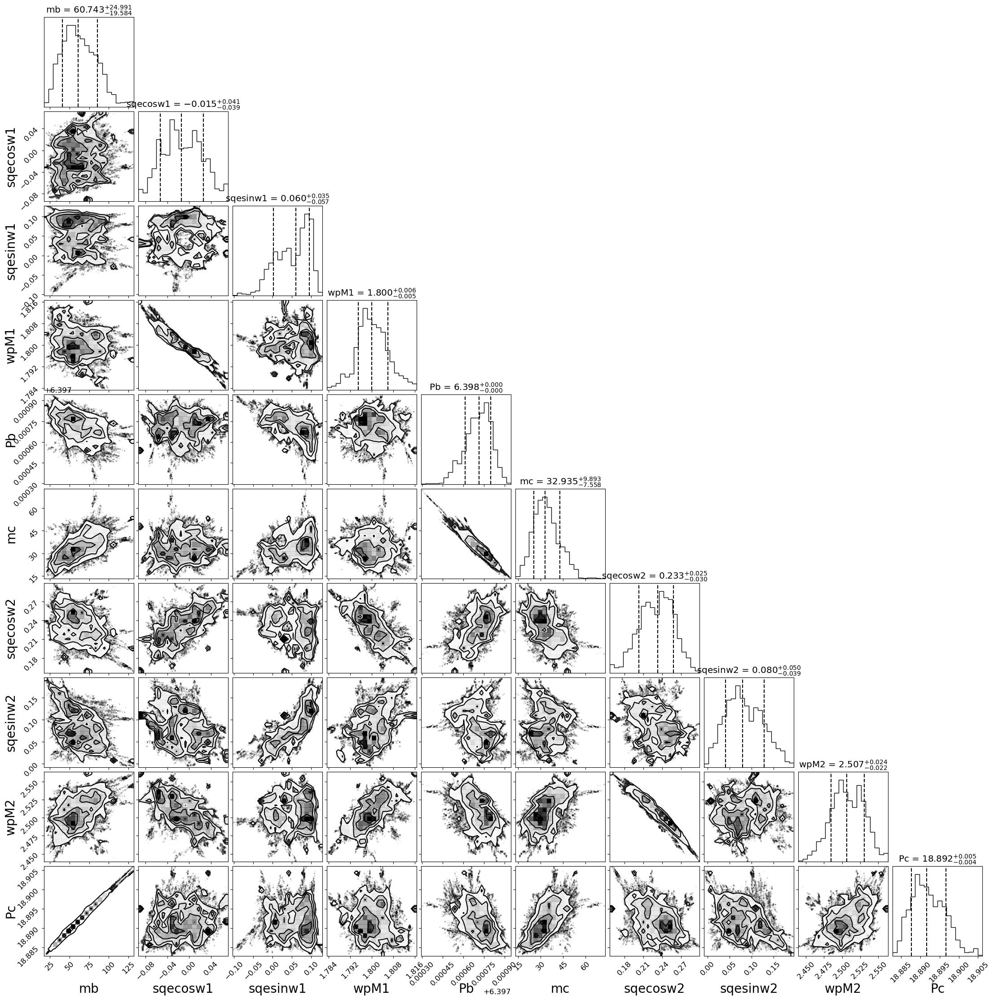

[[871.83924708 868.58923628 871.43296519 ... 872.45753008 873.41372723
  873.54883856]
 [871.83924708 868.58923628 871.43296519 ... 872.45753008 873.41372723
  873.54883856]
 [871.83924708 868.58923628 871.43296519 ... 872.45753008 873.41372723
  873.54883856]
 ...
 [869.97646858 871.90158582 870.10951482 ... 870.33877809 873.038189
  867.41324168]
 [869.97646858 871.90158582 870.10951482 ... 870.33877809 873.038189
  867.41324168]
 [869.97646858 871.90158582 870.10951482 ... 870.33877809 873.038189
  867.41324168]]


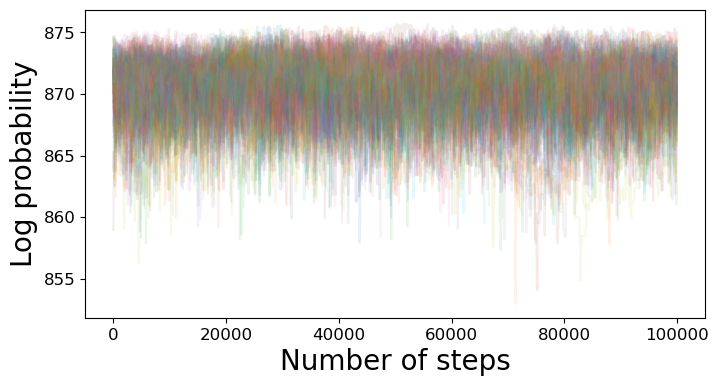

875.6923276725231
[5.39038434e+01 1.60623320e-03 9.64896960e-02 1.79783910e+00
 6.39766977e+00 3.46579250e+01 2.40566060e-01 1.23011299e-01
 2.49498896e+00 1.88904070e+01]


100%|█████████████████████████████████████████| 100000/100000 [2:01:34<00:00, 13.71it/s]


61.66218928102387 + 23.796518409197418 - 23.255950319076568
-0.00857784886874426 + 0.04008982077565065 - 0.04249889616806424
0.06092012451758831 + 0.03476492588178194 - 0.06541843038869175
1.7990243023197516 + 0.008599727845301608 - 0.004843320599160705
6.397713562506021 + 6.964240114371023e-05 - 9.772794731599532e-05
33.45221931663905 + 7.905986982388008 - 6.808551140373332
0.23010343546803919 + 0.03037688569298458 - 0.031916163404073356
0.08048211156314918 + 0.05327132084702717 - 0.04055914554757616
2.5103540226875793 + 0.02168968157506468 - 0.029755515715374603
18.89179949539598 + 0.004825830299484579 - 0.004733091271212686


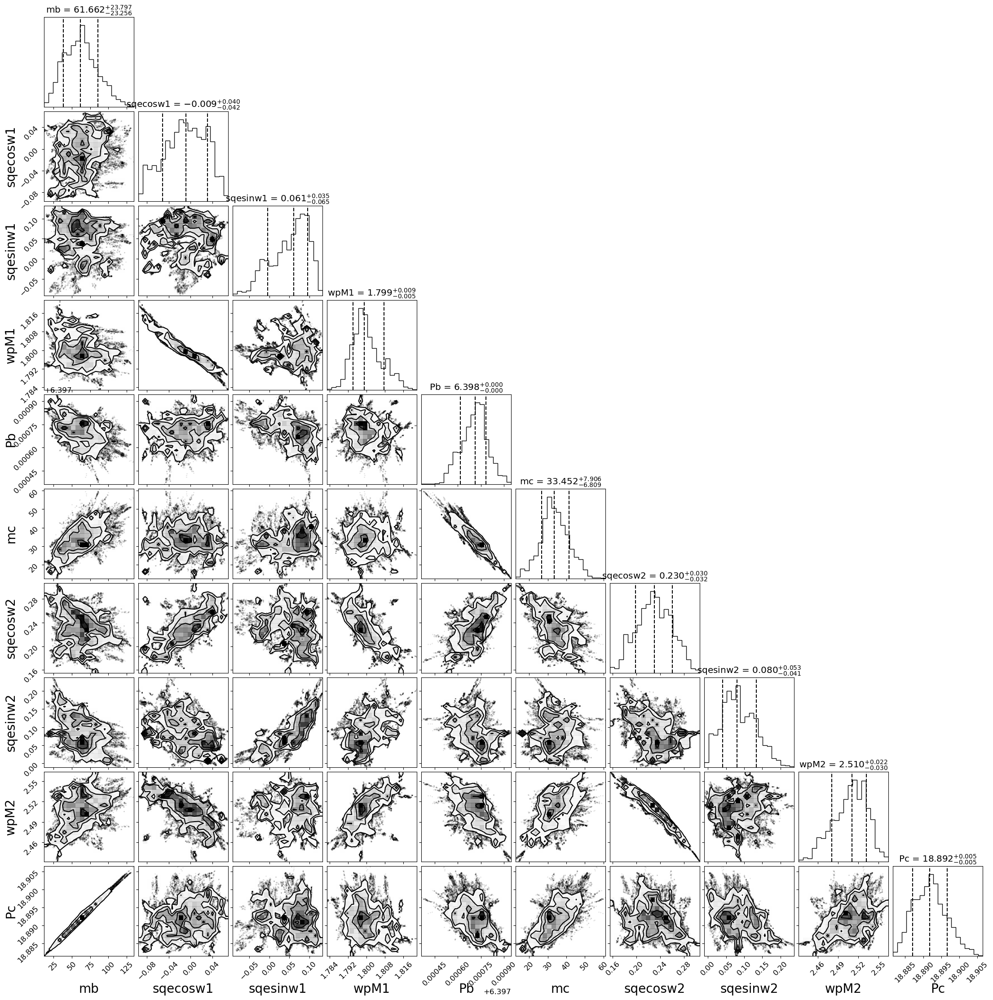

[[869.97646858 871.90158582 870.10951482 ... 870.33877809 873.038189
  867.41324168]
 [869.97646858 871.90158582 870.10951482 ... 870.33877809 873.038189
  867.41324168]
 [869.97646858 871.90158582 870.10951482 ... 870.33877809 873.038189
  867.41324168]
 ...
 [871.04537862 872.03037477 871.39697971 ... 871.33873062 869.9729386
  867.49931893]
 [871.04537862 872.03037477 871.39697971 ... 871.33873062 869.9729386
  867.49931893]
 [871.04537862 872.03037477 871.39697971 ... 871.33873062 869.9729386
  867.49931893]]


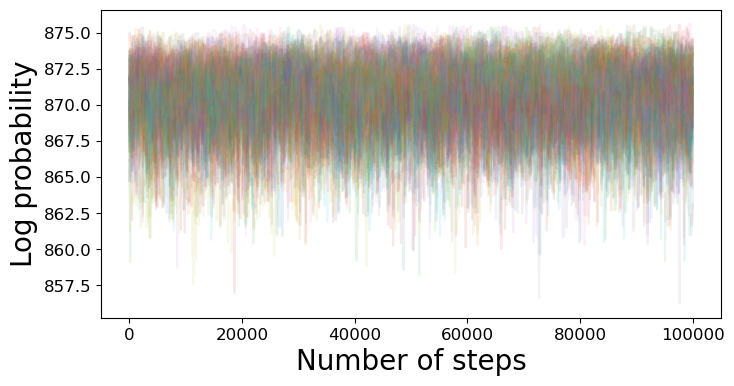

875.6330340674261
[4.51441110e+01 1.65191328e-02 1.07830514e-01 1.79452131e+00
 6.39769736e+00 3.14567119e+01 2.55327249e-01 1.42201305e-01
 2.47713640e+00 1.88885968e+01]


100%|█████████████████████████████████████████| 100000/100000 [1:58:15<00:00, 14.09it/s]


58.722247396229605 + 22.984531929165527 - 21.457948678501836
-0.005337692290981865 + 0.040869317907247904 - 0.047705265557406146
0.06258310509208598 + 0.03789704215800524 - 0.0586235063278058
1.7989077335437873 + 0.009020682974260064 - 0.005729784007938443
6.397709260715535 + 8.790669719083155e-05 - 9.358843497686564e-05
32.80508204118041 + 8.08956633602233 - 7.37520632341068
0.23493361014681763 + 0.029778779440658765 - 0.03701393744301279
0.08704495666719071 + 0.05487622540297242 - 0.0480306026577666
2.5053856408280613 + 0.025769943009430474 - 0.029464745809628656
18.89125356070474 + 0.00447670016359325 - 0.004349706773663087


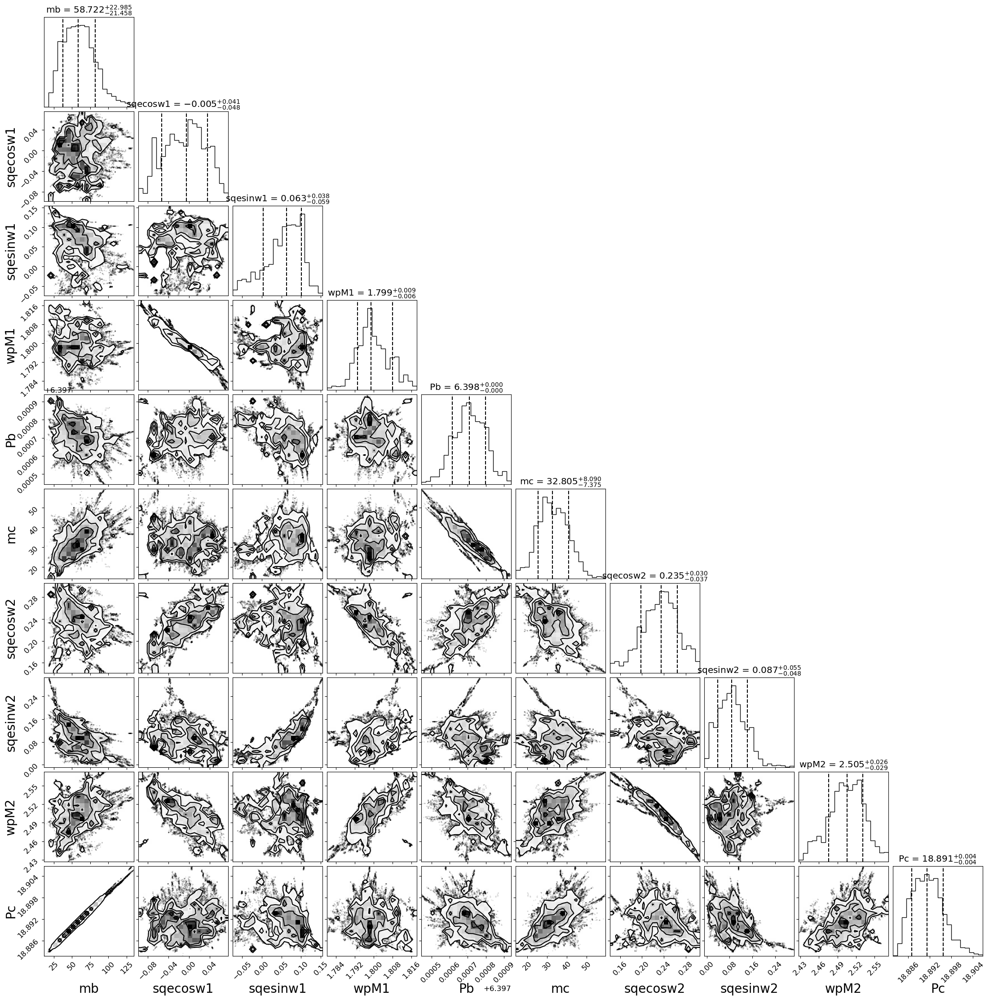

[[871.04537862 872.03037477 871.39697971 ... 871.33873062 869.9729386
  867.49931893]
 [871.04537862 872.03037477 871.39697971 ... 871.33873062 869.9729386
  867.49931893]
 [871.04537862 872.03037477 871.39697971 ... 871.33873062 869.9729386
  866.15962656]
 ...
 [868.22722595 872.19628242 869.64633782 ... 872.81964339 872.48222526
  874.49411735]
 [868.22722595 872.19628242 869.64633782 ... 872.81964339 872.48222526
  874.49411735]
 [868.22722595 872.19628242 869.64633782 ... 872.81964339 872.48222526
  874.49411735]]


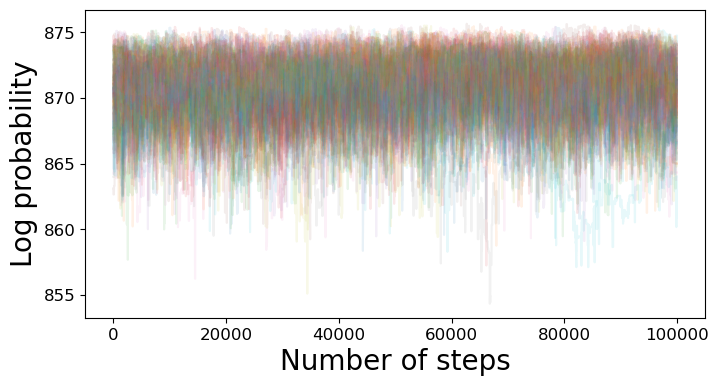

875.6579046467265
[5.27021843e+01 1.14983525e-03 9.90150359e-02 1.79786444e+00
 6.39763435e+00 3.75677919e+01 2.34043378e-01 1.25246162e-01
 2.50057609e+00 1.88901948e+01]


100%|█████████████████████████████████████████| 100000/100000 [1:49:45<00:00, 15.18it/s]


57.53704937338843 + 21.356292705053832 - 19.169474552287248
-0.008285508408603908 + 0.043423284307443535 - 0.04441022642451348
0.06375720869431509 + 0.038488408174676095 - 0.06181536254003159
1.7992323321001078 + 0.008328475783014433 - 0.005581073358047028
6.397712864341145 + 9.063122078689645e-05 - 0.00010958024726726023
32.96242526437403 + 9.786792419281326 - 8.019922455291638
0.2352812483015842 + 0.027209720100425105 - 0.03987994816106458
0.08432681321301766 + 0.06376640040194853 - 0.04492862636293095
2.5060466538026294 + 0.02750419840367746 - 0.02823769723752978
18.891022899440166 + 0.0041422322708619674 - 0.0038138929811317723


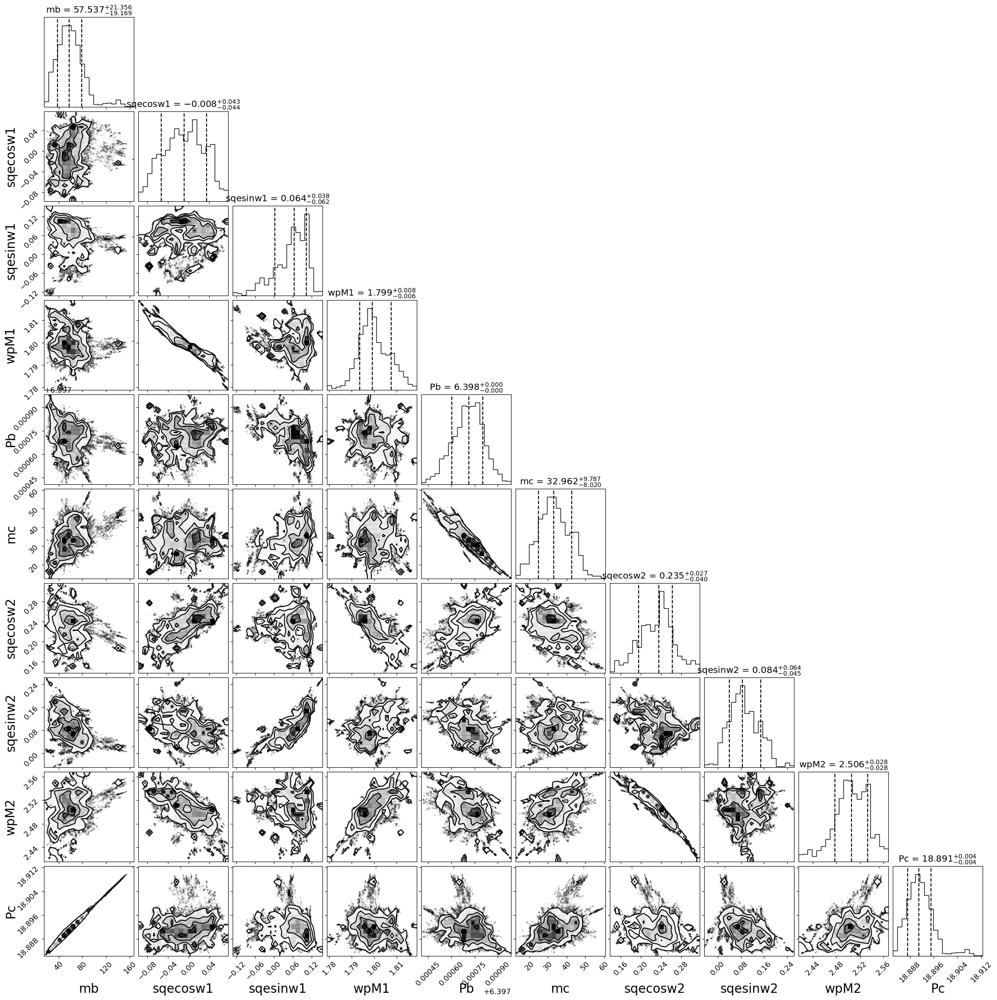

[[868.22722595 872.19628242 869.64633782 ... 872.81964339 872.48222526
  874.49411735]
 [868.22722595 872.19628242 869.64633782 ... 872.81964339 872.48222526
  874.49411735]
 [868.22722595 872.19628242 869.64633782 ... 872.81964339 872.48222526
  874.49411735]
 ...
 [871.82294291 869.46952888 870.87910727 ... 872.87233957 873.22081906
  868.90287405]
 [871.82294291 869.46952888 870.87910727 ... 872.87233957 873.22081906
  868.90287405]
 [871.82294291 869.46952888 870.87910727 ... 872.87233957 873.22081906
  868.90287405]]


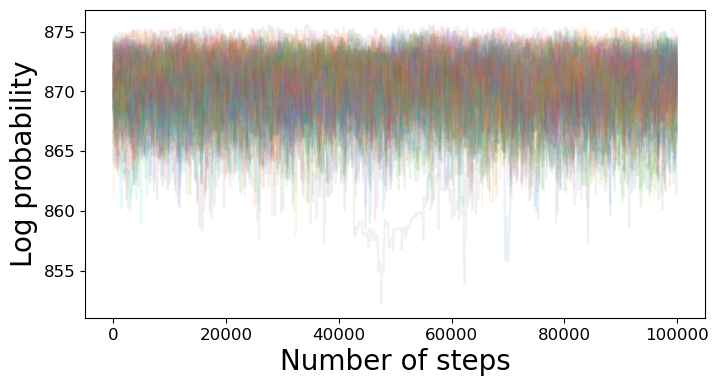

875.4977842111525
[5.09492979e+01 1.46547869e-02 1.09989885e-01 1.79498080e+00
 6.39763238e+00 3.66626379e+01 2.46096292e-01 1.41592316e-01
 2.48590927e+00 1.88898762e+01]


In [102]:
for i in range(5):
    y=mcmc_third(y)